In [61]:

# scripts for laser line crater profile measurement ACQ June 2023
# 40 degree impact 

import numpy as np
import matplotlib.pyplot as plt  # plotting
import pims  # image reading routines
import os  #operating system

# import pandas as pd
#from pandas import DataFrame, Series  
from scipy import ndimage  # for shifting/filtering images
from pims import pipeline  # for video frame batch processing
from pims import Frame  # data structure for image frames
from scipy.signal import savgol_filter  # for smoothing
from matplotlib.patches import Rectangle  # plots rectangles
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
from scipy import signal
from scipy.interpolate import interp1d

%load_ext autoreload
%autoreload 2

#%matplotlib inline
# use this if you don't want active plots, non-interactive backend

# use this if you want to be able to find pixel numbers live! interactive backend
%matplotlib notebook

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In this notebook I measure a crater profile from a 40 degree impact

I measured ricochet velocity and angle 

I make a figure of crater profile and one of still photograph of crater from above

I made figures of ejecta curtains from 1000fps video

The 1000 fps video was used to correct coordinates so that 0 is impact site. 

In [59]:
froot = 'A40_'  # for output files

In [2]:
mfile='laser_scan_data/June_1_2023/pngs/bk*.png'
framesrgb = pims.open(mfile)  
# this is blackmagick video 60fps of laser scan
# that was processed on command line 
#/usr/local/bin/ffmpeg -i A040_C002.mov -r 2  bk%04d.png -hide_banner
# -r 2 is desired fps for image output  (2 frames per second!)
# the png frames were put in the pngs directory
C_angle = 45.0*np.pi/180.0  # camera angle from horizontal 

In [3]:
# check the image sizes
framesrgb[10].shape  # 2160x3840 pixels! wow!
# notice [y, x, color] order of indexing

(2160, 3840, 3)

In [4]:
len(framesrgb)  # how many images we extracted from the movie

147

<IPython.core.display.Javascript object>


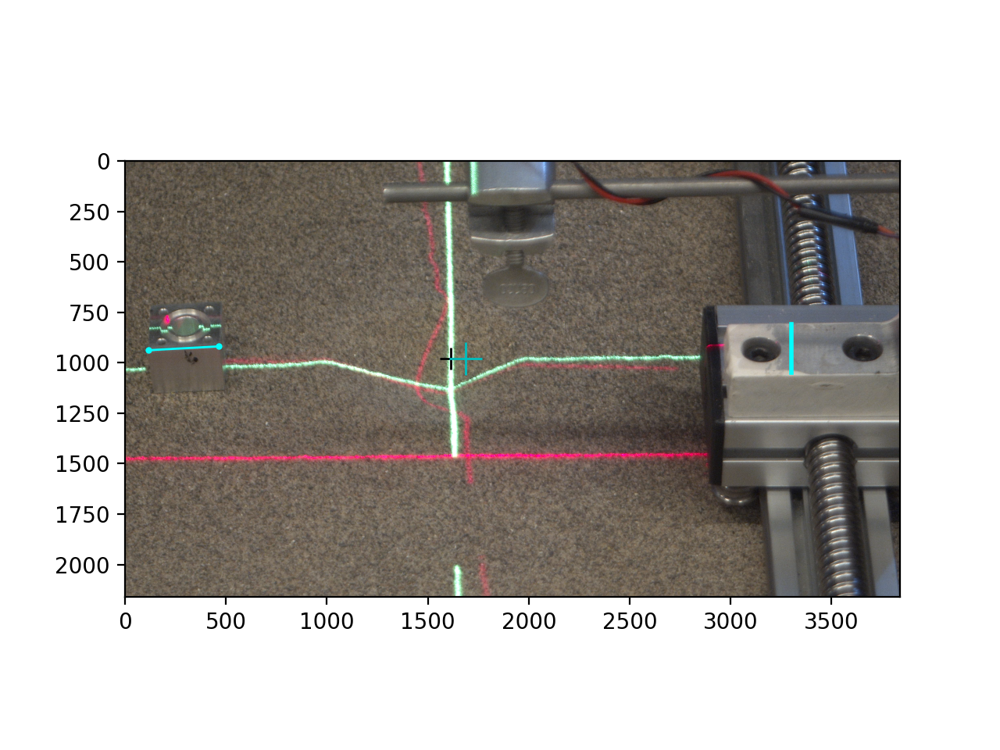

pixscale = 0.0727 mm/pixel
ybscale = 0.106 mm per pix
ang 43.4 degrees


In [5]:
# show an image and get pixel scale
plt.imshow(framesrgb[10])
x0,y0 = 116,938  # marked by hand on image when in notebook backend and then I plotted it as a blue segment
x1,y1 = 465,919
plt.plot([x0,x1],[y0,y1],'o-',ms=2,color='cyan',alpha=1.0,lw=1)
dx = np.sqrt((x1-x0)**2 + (y1-y0)**2)   #in pixels, length of cyan line
pixscale_mm_per_pix = 25.4/dx  # mm/pixel    metal cube is 1"=25.4mm wide
print('pixscale = {:.4f} mm/pixel'.format(pixscale_mm_per_pix))

x_grn,y_impact = 1614,979  # impact point estimated from green laser, needs correcting later based on hsvx
x_impact = x_grn + 73  # correction from hsv (computed below) to impact point
plt.plot([x_grn],[y_impact],'k+',ms=10) # plot green laser position
plt.plot([x_impact],[y_impact],'c+',ms=15)  # plot impact site

#checking camera angle by looking at width of cyan bar on right 
yb2=1050; yb1=810
plt.plot([3300,3300],[yb1,yb2],'-',color='cyan',lw=2)
ybscale = 25.4/(yb2-yb1)   # metal bar is 1" wide which is 25.4 mm
print('ybscale = {:.3f} mm per pix'.format(ybscale))
ang = np.arcsin(pixscale_mm_per_pix/ybscale)
#print(pixscale_mm_per_pix/ybscale)
print('ang {:.1f} degrees'.format(ang*180/np.pi))  #check camera angle, 
# this is very very good as it is close to 45 degrees and that is what we measured for camera angle

<IPython.core.display.Javascript object>


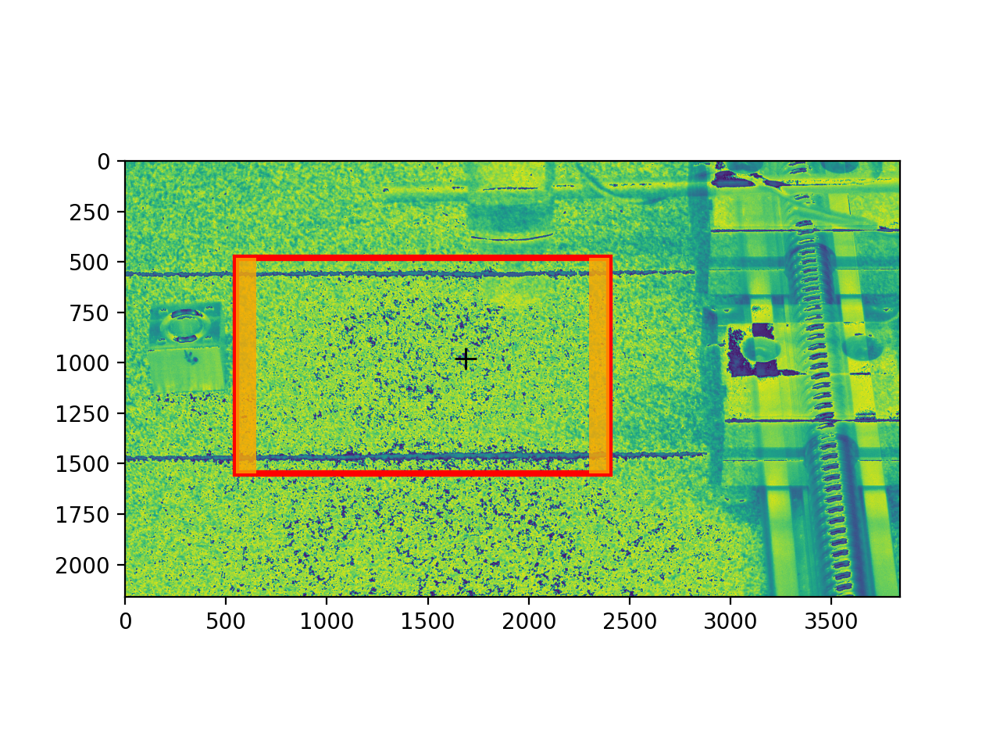

In [6]:
# choose frames and boxes in frame for analysis
# choosing the following numbers!
xmin,xmax = 550,2400  # range in x pixels for columns measurement
ymin,ymax = 480,1550  # range in y pixels for finding max 
ww=100 # region on either side of array to remove a linear fit
f1,f2 = 21,134 # range for frames (covering crater!)
# motion only starts at 20
fig,ax = plt.subplots(1,1)
R1 = Rectangle([xmin, ymin], xmax-xmin, ymax-ymin,facecolor="none", edgecolor='red',alpha=1,lw=3)
# red box shows extraction region
R2 = Rectangle([xmin, ymin], ww, ymax-ymin,facecolor="orange", edgecolor='none',alpha=0.8)
R3 = Rectangle([xmax-ww, ymin], ww, ymax-ymin,facecolor="orange", edgecolor='none',alpha=0.8)
# orange boxes show where we consider background for a linear fit
ax.imshow(framesrgb[f1][:,:,0] + framesrgb[f2][:,:,0])  # show frame range 
ax.add_patch(R1)  #plot the rectangles! 
ax.add_patch(R2)
ax.add_patch(R3)
ax.plot([x_impact],[y_impact],'k+',ms=10)
# goal is to bracket the crater and we have. 
# we can't go below f=21 as scan was not moving then 

In [7]:
# smooth entire set of images with a gaussian filter!
# sig is fwhm of gaussian filter
# returns a red image only
@pipeline
def gfilt(frame,sig):
    red  = np.array(frame[:,:,0])  # choose red image only 
    redf = red.astype('float')
    #redfs = ndimage.median_filter(redf,sig)
    redfs = ndimage.gaussian_filter(redf,sig)
    i = frame.frame_no
    z= Frame(redfs)
    z.frame_no = i  
    # restore frame number information 
    return z

<IPython.core.display.Javascript object>


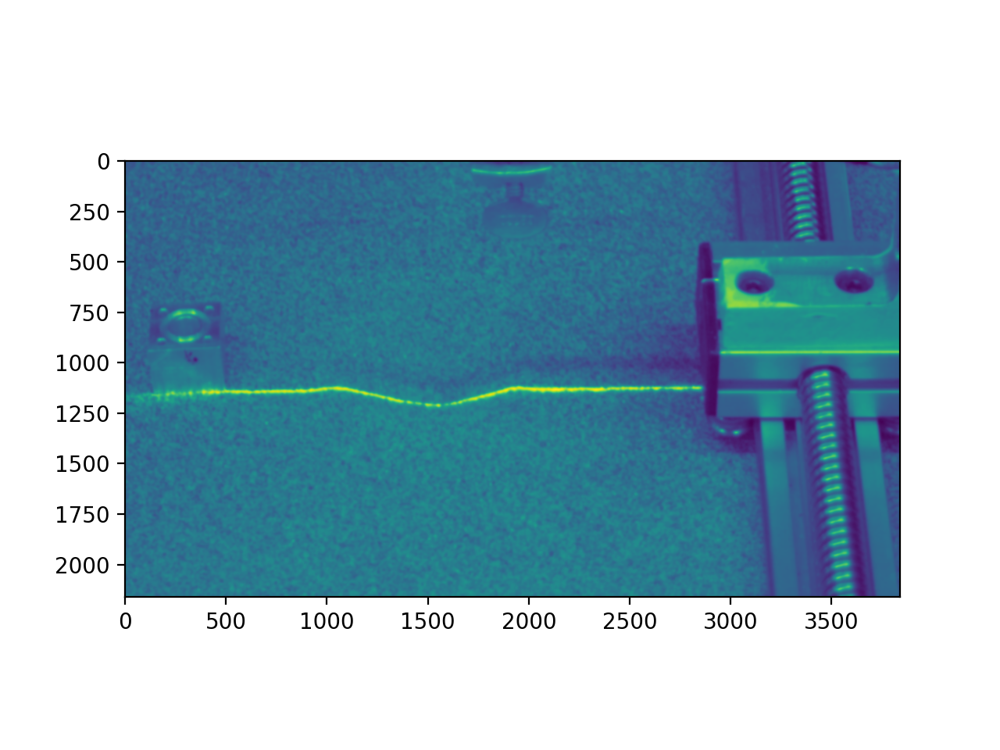

In [8]:
frames = gfilt(framesrgb[:],5)  #smooth image a bit, reduce frames to only red image 
plt.imshow(frames[60]) # this is now a red image

<IPython.core.display.Javascript object>


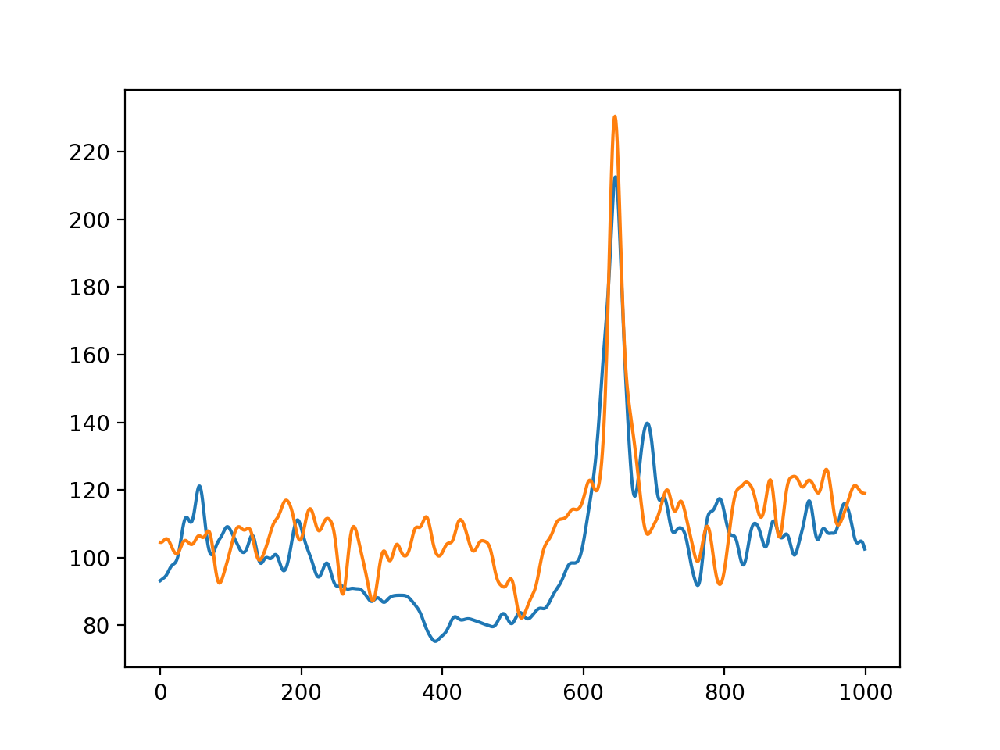

In [31]:
junk = ndimage.rotate(frames[60],-0.5) # not bothering to rotate images 
plt.plot(junk[500:1500,500])
plt.plot(junk[500:1500,2000])

In [22]:
# find peaks (max) along a column of data (x-pixel) in a single red frame
# used for measuring crater profile from laser line images 
# this version fits a line to window on left/right sides and subtracts it from the data
# inputs:
#  x1 to x2 is region in x (pixels) that we want to extract information in each frame
#  y1 to y2 is region in y (pixels) that we want to find maximum values in each frame
#  wl,wr: width of left and right regions for a linear slope removal
#  frame: is a pims frame but without color, so is a 2d array 
#      here x1,x2,y1,y2,frame should be integers and x1<x2 and y1<y2
# returns:
#   xlist: the array of xvals (pixel numbers) 
#   ylist: an array of ypeak vals 
#   ylist_p: and array of peak vals subtracted via linear fit to left and right edges
#   p_coofs: coefficients of linear fit
def findmax(x1,x2,y1,y2,wl,wr,frame):

    xlist = np.arange(x1,x2)  # make an xpixel array
    ylist = xlist*0  # to store depths in pixels
    wlist = ylist*0  # for weights for left/right windows
    #im_whole = np.squeeze(frame[:,:])  # red image after filtering
    #im = frame[y1:y2]  # restrict possible y range for image 
    for i in range(x1,x2):
        jj = np.argmax(frame[y1:y2,i])  #[y, x, color] order for indexing in frame
        ylist[int(i-x1)] = jj+y1  # location of peak
    wlist[0:wl] = 1 # create left and right windows
    wlist[-wr:-1]=1
    wlist[-1] = 1  # weights
    pcoofs=np.polyfit(xlist, ylist, 1,w=wlist)  # linear fit to left and right windows
    # pcoofs contains [slope, intercept]
    pfun = np.poly1d(pcoofs)  # make a line function
    pfit = pfun(xlist)     # make the fitted line
    ylist_p = ylist - pfit  # subtract off linear fit
    #plt.plot(xlist,ylist)
    #plt.plot(xlist,pfit)
    return xlist,ylist,ylist_p,pcoofs

# compute how many pixels is moved vertical per frame by the laser line
# calibration to pixels in y direction!!!! using 2 frames given by f1,f2
# returns coefficients of a line, slope and intercept that is a function of frame number
def yscale(x1,x2,y1,y2,f1,f2,xcenter,ycenter,frames):
    dx = int((x2-x1)/2)  # half width
    # fit lines to both sides 
    xl,yl1,ylist_p,pcoofs1 = findmax(x1,x2,y1,y2,dx,dx,frames[f1])
    xl,yl2,ylist_p,pcoofs2 = findmax(x1,x2,y1,y2,dx,dx,frames[f2])
    pfun1 = np.poly1d(pcoofs1)
    pfun2 = np.poly1d(pcoofs2)
    ymid1 = pfun1(xcenter) #- ycenter
    ymid2 = pfun2(xcenter) #- ycenter
    yfit1 = pfun1(xl)
    yfit2 = pfun2(xl)
    y_pix_per_frame = (ymid2-ymid1)/(f2-f1)  # slope
    b_intercept = ymid1 - y_pix_per_frame*f1  # intercept in pix
    # show linear fits to lines on either side of crater
    fig,axarr = plt.subplots(2,1,sharex=True)
    plt.subplots_adjust(hspace=0,wspace=0)
    axarr[0].plot(xl,yl1,'.')
    axarr[0].plot(xl,yfit1,'-')
    axarr[1].plot(xl,yl2,'.')
    axarr[1].plot(xl,yfit2,'-')
    fsfun = interp1d([f1,f2], [pcoofs1[0],pcoofs2[0]])  # interpolation function for slopes
    fbfun = interp1d([f1,f2], [pcoofs1[1],pcoofs2[1]])  # interpolation function for intercepts
    
    # this is a line that gives y value as a function of frame number, in pixels
    # y  = slope*f + b_intercept
    #print(ymid1,ymid2)
    print('coefs f1:',pcoofs1)
    print('coefs f2:',pcoofs2)
    return y_pix_per_frame, b_intercept, fsfun, fbfun
    # the slope gives yvalues of the laser lines at impact x-value divided by distance in numbers of frames
    
    
# find peaks (max) along a column of data (x-pixel) in a single red frame
# used for measuring crater profile from laser line images 
# this version fits a line to window on left/right sides and subtracts it from the data
# inputs:
#  x1 to x2 is region in x (pixels) that we want to extract information in each frame
#  y1 to y2 is region in y (pixels) that we want to find maximum values in each frame
#  fi: index of frame
#  frames:  array of frames
#  is a list of pims frames but without color, so is a 2d array 
#      here x1,x2,y1,y2,frame should be integers and x1<x2 and y1<y2
#  fsfun, fbfun  interpolation functions to give slope and intercept for linear fits
# returns:
#   xlist: the array of xvals (pixel numbers) 
#   ylist: an array of ypeak vals 
#   ylist_p: and array of peak vals subtracted via a line

def findmax_cofs(x1,x2,y1,y2,fsfun,fbfun,fi,frames):

    xlist = np.arange(x1,x2)  # make an xpixel array
    ylist = np.zeros(len(xlist)) # to store depths in pixels
    frame = frames[fi][:,:]
    pcoofs = [fsfun(fi),fbfun(fi)]
    for i in range(x1,x2):
        jj = np.argmax(frame[y1:y2,i])  #[y, x, color] order for indexing in frame
        ylist[int(i-x1)] = jj+y1  # location of peak   
        
    pfun = np.poly1d(pcoofs)  # make a line function
    pfit = pfun(xlist)     # make the fitted line
    ylist_p = ylist - pfit  # subtract off the linear fit
    #plt.plot(xlist,ylist)
    #plt.plot(xlist,pfit)
    return xlist,ylist,ylist_p,pcoofs

# process a series of images to scan crater shape
# call findmax() for frames f1 through f2, from a series of frames
# fill a 2darray with scan info for each frame 
def findmax_arr(x1,x2,y1,y2,w,f1,f2,frames):
    xlist = np.arange(x1,x2)  # range in x in pixels
    flist = np.arange(f1,f2)  # list of frame numbers
    yarr = np.zeros([f2-f1,x2-x1])  # bare 2d-array
    slope_list = np.zeros(f2-f1)
    b_list = np.zeros(f2-f1)
    for j in range(f1,f2):
        frame = frames[j]
        xl,yl,ylist_p,pcoofs  = findmax(x1,x2,y1,y2,w,w,frame)
        slope_list[j-f1] = pcoofs[0]  # store slope
        b_list[j-f1] = pcoofs[1]  # store intercept
        yarr[j-f1,:] = ylist_p
    return xlist,flist,yarr,slope_list,b_list



<IPython.core.display.Javascript object>


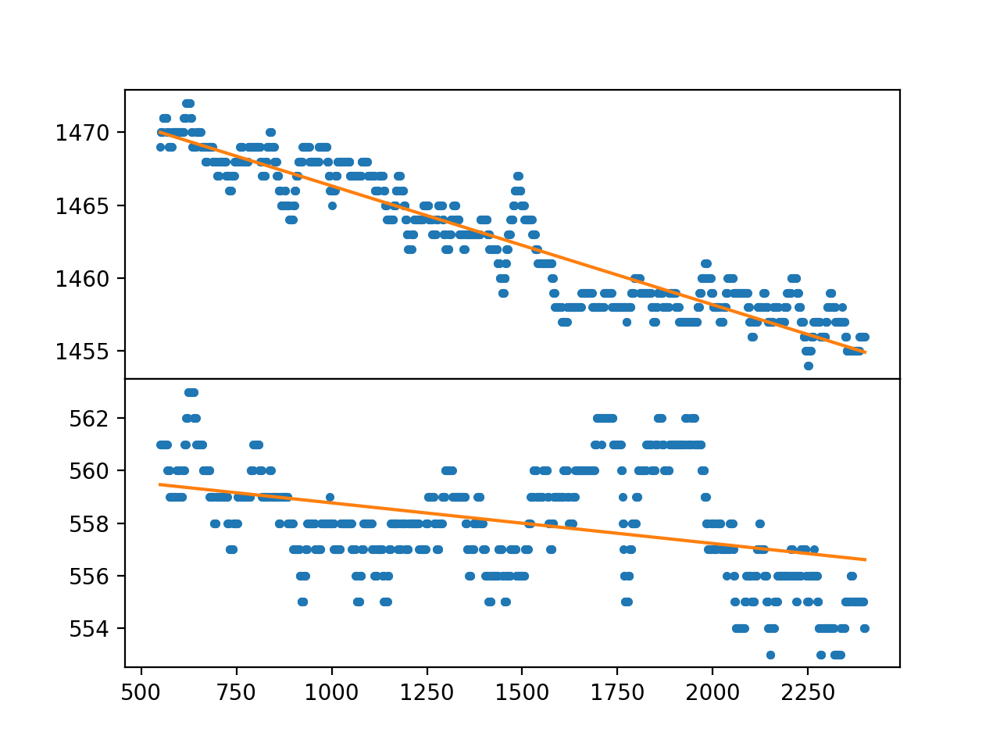

coefs f1: [-8.15034894e-03  1.47447661e+03]
coefs f2: [-1.54510049e-03  5.60315548e+02]
pixels per frame motion in y -7.991
intercept 1628.54
ymid1 1460.7
ymid2 557.7


In [17]:
# compute pixels per frame
px_per_frame,b_intercept,fsfun,fbfun = yscale(xmin,xmax,ymin,ymax,f1,f2,x_impact,y_impact,frames)
print('pixels per frame motion in y {:.3f}'.format(px_per_frame))
print('intercept {:.2f}'.format(b_intercept))
print('ymid1 {:.1f}'.format(f1*px_per_frame + b_intercept))
print('ymid2 {:.1f}'.format(f2*px_per_frame + b_intercept))

<IPython.core.display.Javascript object>


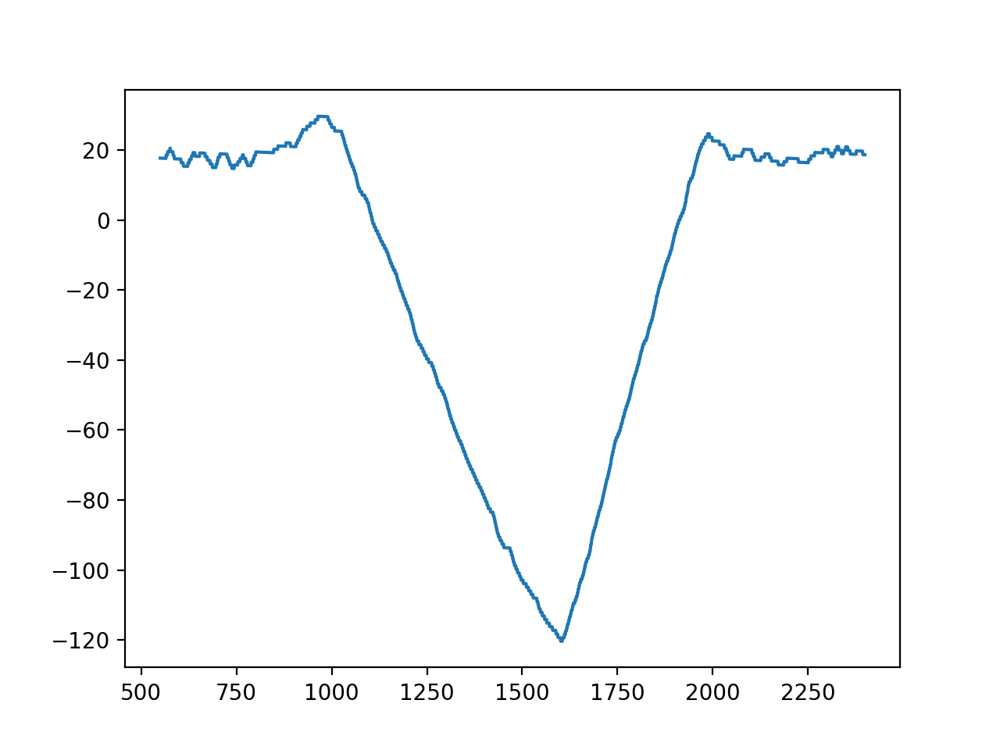

In [23]:
# check the extraction at one spot in the middle
fmid = int((f2+f1)/2)
xl,yl,ylist_p,pcoofs = findmax_cofs(xmin,xmax,ymin,ymax,fsfun,fbfun,fmid,frames)
fig,ax = plt.subplots(1,1)
ax.plot(xl,-ylist_p)
# not using this, so sticking to previous routine

In [32]:
# run all frames 
xlist,flist,zarr,slope_list,b_list = findmax_arr(xmin,xmax,ymin,ymax,ww,f1,f2,frames)


<IPython.core.display.Javascript object>


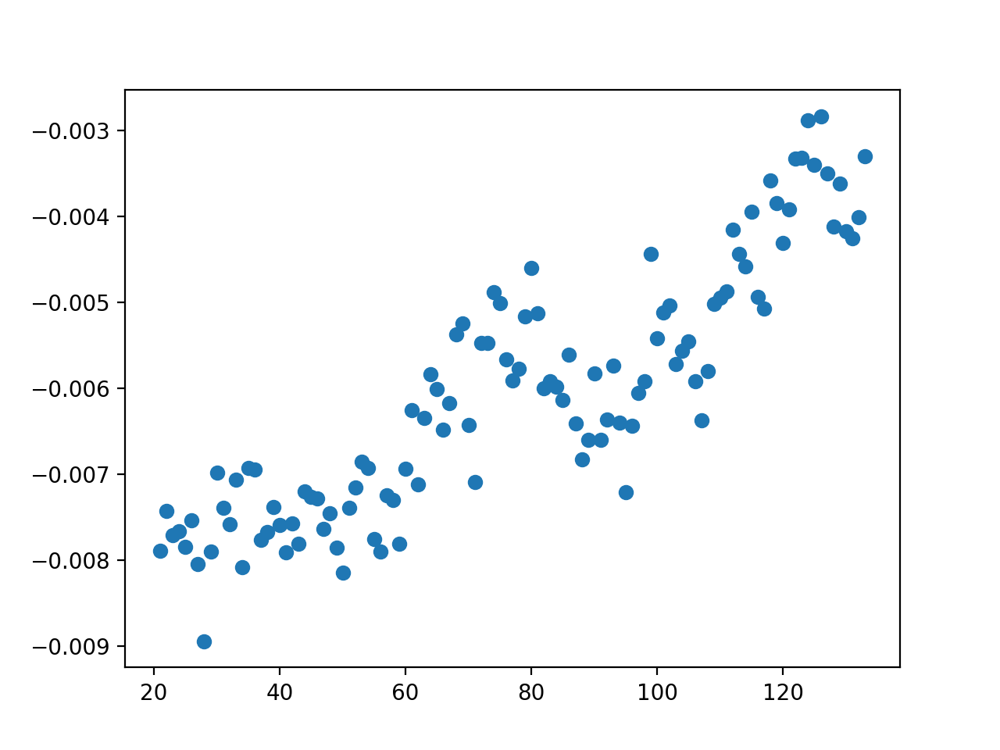

[-0.00788432 -0.00742653 -0.00770913 -0.00765739 -0.00784392 -0.00753299
 -0.00804438 -0.00893934 -0.00789329 -0.00697654 -0.00738562 -0.00758198
 -0.00705942 -0.00807554 -0.00692324 -0.00694291 -0.00776338 -0.0076641
 -0.00737318 -0.0075884  -0.00790312 -0.00756946 -0.00780852 -0.00719665
 -0.00725804 -0.00727639 -0.00763248 -0.00745055 -0.00784969 -0.00814183
 -0.00738437 -0.00715305 -0.00684698 -0.00691919 -0.00775314 -0.00789676
 -0.00723688 -0.00729347 -0.00780474 -0.00693226 -0.00625014 -0.00711365
 -0.00633975 -0.00583115 -0.00600808 -0.00648131 -0.0061689  -0.00536484
 -0.00523778 -0.00642351 -0.00708728 -0.00546498 -0.00546457 -0.00487978
 -0.00500489 -0.00566348 -0.00590635 -0.0057649  -0.00516221 -0.00459219
 -0.00512165 -0.00599887 -0.00591263 -0.00597837 -0.00612769 -0.00560636
 -0.00640614 -0.0068195  -0.00659189 -0.00582445 -0.006595   -0.0063585
 -0.00573148 -0.00639896 -0.00720248 -0.00643096 -0.00605159 -0.0059152
 -0.00443524 -0.00541047 -0.00511291 -0.00503176 -0.00

In [33]:
# plt.plot(flist[1:],b_list[1:],'o') #I checked intercept, looked good, motion starts at f=21
plt.plot(flist[:],slope_list[:],'o') 
print(slope_list)
# bump in center means our slope fitting is causing a problem.  
# we are over subtracting due to ejecta on the left side

In [34]:
# convert to mm and make axes w.r.t impact point
xmm  = (xlist- x_impact)*pixscale_mm_per_pix  # get mm  from impact site 
ymm  = (flist*px_per_frame + b_intercept - y_impact-40) *pixscale_mm_per_pix/np.sin(C_angle) # get mm 
zmm  = -zarr*pixscale_mm_per_pix/np.cos(C_angle)
zmm_filt = ndimage.median_filter(zmm,3)
dx = xmm[1]-xmm[0]
dy = ymm[1]-ymm[0]
print('pixel widths dx,dy= {:.3f},{:.3f} mm'.format(dx,dy))  #pixel widths in the depth profile

# for plots window in mm from impact site, hard set range of display
x_winl, x_winr = -75,50
y_winl, y_winr = -50,50

pixel widths dx,dy= 0.073,-0.821 mm


<IPython.core.display.Javascript object>


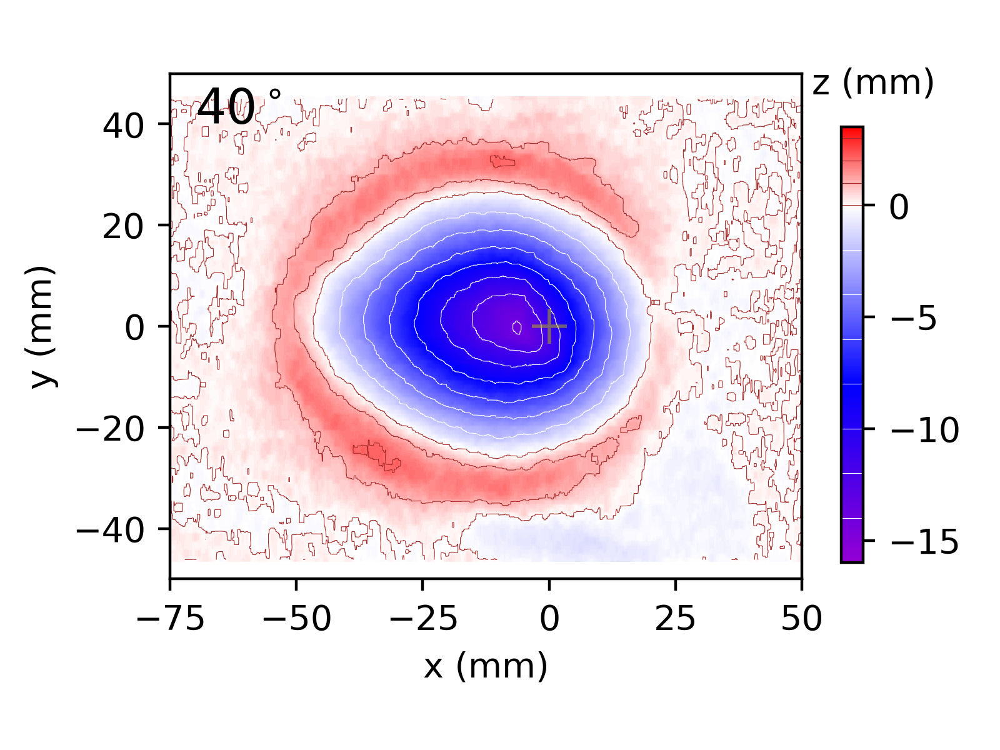

In [102]:
# make a nice figure of crater profile!
#from matplotlib.colors import ListedColormap, LinearSegmentedColormap
extent = [np.min(xmm),np.max(xmm),np.min(ymm),np.max(ymm)]  # for x,y axes of plots
fig,ax = plt.subplots(1,1,figsize=(4,3),dpi=200,facecolor='white')
plt.subplots_adjust(bottom=0.15,top=0.98,left=0.17,right=0.96)
ax.set_aspect(1.0)

vmin,vmax=-16,3.5  # display range mm, these can be adjusted!
mcolors=['darkviolet','blue','white','red']
white_node = np.abs(vmin)/(vmax-vmin)
cyan_node  = np.abs(vmin/2)/(vmax-vmin)
nodes = [0.0, cyan_node,white_node,1.0]
cmap2 = LinearSegmentedColormap.from_list("mycmap", list(zip(nodes, mcolors)))
im=ax.imshow(zmm_filt,extent=extent,vmin=vmin,vmax=vmax,cmap=cmap2)
#levs = [-14,-12,-10,-8,-6,-4,-2,0,1,2]
levs = np.append(np.arange(-14,0,2),np.arange(0,4,1))
cols = []
for i in range(len(levs)):
    if (levs[i] <0):
        cols = np.append(cols,'white')
    else:
        cols = np.append(cols,'brown')

ccw=ax.contour(zmm_filt, extent=extent,levels=levs,colors=cols,linewidths=0.2,origin='upper')
cbar=plt.colorbar(im,shrink=0.7,anchor=(0.0, 0.4))
ax.text(52,46,'z (mm)')
cbar.add_lines(ccw)  # can only add one set of lines! set erase=False in order to do two sets!
ax.set_xlim([x_winl,x_winr])
ax.set_ylim([y_winl,y_winr])
ax.set_ylabel('y (mm)')
ax.set_xlabel('x (mm)')
ax.plot([0],[0],'y+',ms=10,lw=1,alpha=0.5)
ii = np.argmin(zmm_filt)  # find deepest point!
i,j=np.unravel_index(ii, zmm_filt.shape)
ax.text(-70,40,froot[1:3]+r'$^\circ$',color='black',fontsize=14)
plt.savefig(froot+'contour.png',dpi=200)
# looks good!

In [96]:
# measure crater volume (negative regions within a certain radius of impact point)
def crater_volume(xmm,ymm,zmm,dleft,dright,dbottom,dtop):
    zsum=0.
    for i in range(len(xmm)):
        if (xmm[i]>dleft) and (xmm[i]<dright):
            for j in range(len(ymm)):
                if (ymm[j]>dbottom) and (ymm[j]<dtop):
                    if (zmm[j,i]<0):
                        zsum += zmm[j,i]
                        
    dxdy = (xmm[1]-xmm[0])*(ymm[1]-ymm[0])
    zsum *= dxdy  # should be in mm^3
    return zsum

vol = crater_volume(xmm,ymm,zmm_filt,-45,22,-28,28)
print('MEASUREMENT')
print('vol = {:.2f} cm^3'.format(vol/1e3))

MEASUREMENT
vol = 13.19 cm^3


<IPython.core.display.Javascript object>


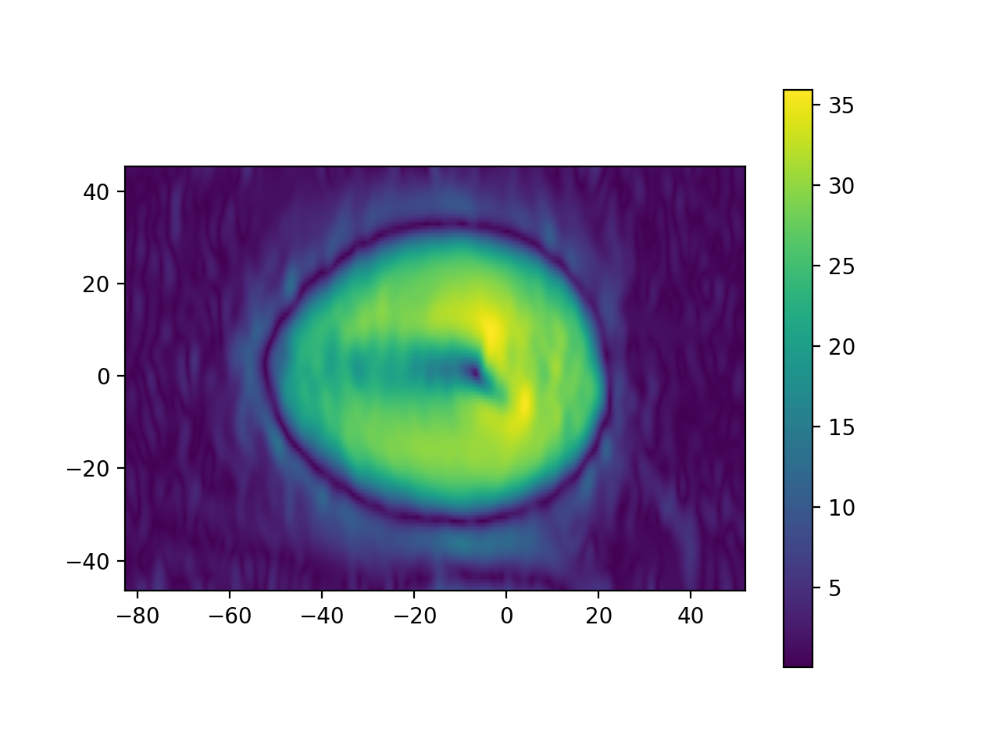

In [62]:
# compute a local slope
dxmm = xmm[1]-xmm[0]; dymm= ymm[1]-ymm[0]
#zmm_filtx = ndimage.median_filter(zmm,[5,21])  # more agressive filtering in x
zmm_filtx = ndimage.gaussian_filter(zmm,[3,13])  # more agressive filtering in x
del_x = savgol_filter(zmm_filtx,31,2,deriv=1,axis=1,delta=dxmm)  # dz/dx
del_y = savgol_filter(zmm_filtx,11,2,deriv=1,axis=0,delta=dymm)  # dz/dy
#window_length, polyorder, deriv=0, delta=1.0,
slope = np.arctan(np.sqrt(del_x**2 + del_y**2))  # |del z|
slope_deg= slope*180/np.pi
#im=plt.imshow(del_x,extent=extent)
#im=plt.imshow(del_y,extent=extent)
im=plt.imshow(slope_deg,extent=extent)
plt.colorbar(im)

<IPython.core.display.Javascript object>


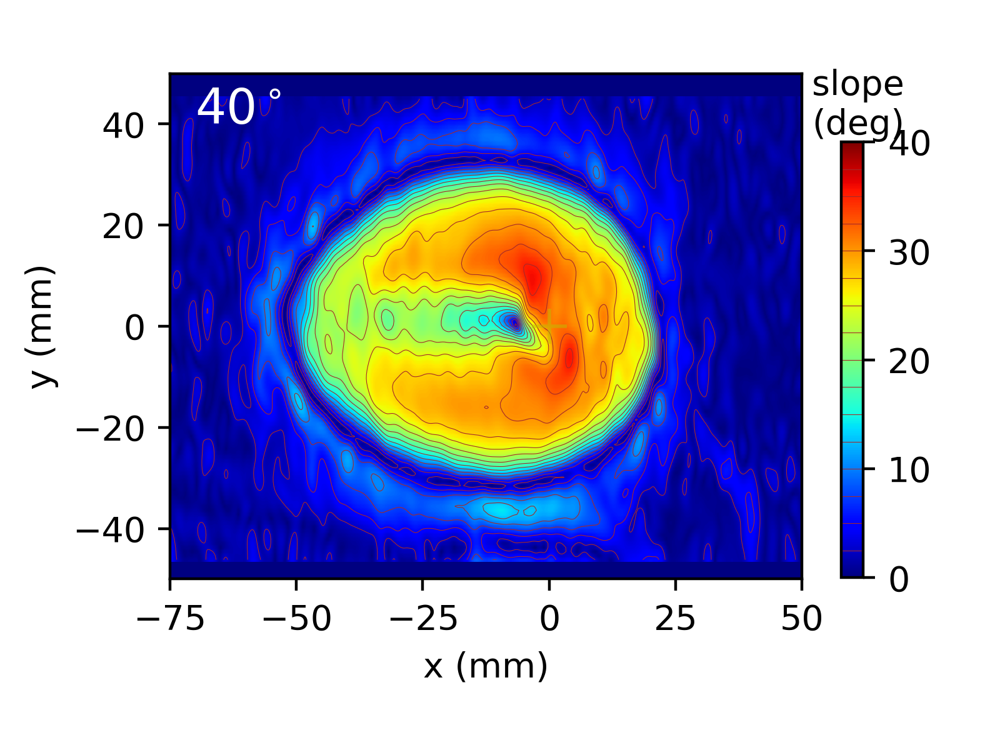

In [99]:
# make a nice figure of crater slopes!
extent = [np.min(xmm),np.max(xmm),np.min(ymm),np.max(ymm)]  # for x,y axes of plots
fig,ax = plt.subplots(1,1,figsize=(4,3),dpi=200,facecolor='white')
plt.subplots_adjust(bottom=0.15,top=0.98,left=0.17,right=0.96)
ax.set_aspect(1.0)
vmin,vmax=0,40  # display range degrees, these can be adjusted!
ax.set_facecolor('navy')
im=ax.imshow(slope_deg,extent=extent,vmin=vmin,vmax=vmax,cmap='jet')
levs = np.arange(vmin,vmax,2.5)
cols = 'brown'
ccw=ax.contour(slope_deg, extent=extent,levels=levs,colors=cols,linewidths=0.2,origin='upper')
cbar=plt.colorbar(im,shrink=0.7,anchor=(0.0, 0.32))
#cbar.set_label('z (mm)')
ax.text(52,38,'slope \n(deg)')
cbar.add_lines(ccw)  
ax.set_xlim([x_winl,x_winr])
ax.set_ylim([y_winl,y_winr])
ax.set_ylabel('y (mm)')
ax.set_xlabel('x (mm)')
ax.plot([0],[0],'y+',ms=10,lw=1,alpha=0.5)
ax.text(-70,40,froot[1:3]+r'$^\circ$',color='white',fontsize=14)
plt.savefig(froot+'slope.png',dpi=200)
# looks good!

In [54]:
# some measurements:
ii = np.argmin(zmm_filt)  # find deepest point!
i,j=np.unravel_index(ii, zmm_filt.shape)
print('MEASUREMENTS')
print('max depth {:.2f}'.format(zmm_filt[i,j]))  
x_zmax = xmm[j]  #  position of deepest point,  this is distance between max depth and impact point
print('x of max depth {:.2f} mm'.format(x_zmax))
jj = np.argmax(zmm_filt)  # find deepest point!
i,j=np.unravel_index(jj, zmm_filt.shape)
print('max rim height {:.2f}'.format(zmm_filt[i,j]))  

MEASUREMENTS
max depth -14.26
x of max depth -6.18 mm
max rim height 2.15


In [55]:
zmm_filt.shape

(113, 1850)

In [56]:
# find two peaks, left and right, in a profile that crosses x=0
def twopeaks(xarr,zarr):
    j0 = np.argmin(np.abs(xarr))  # where x=0
    jr = np.argmax(zarr[j0:])
    jl = np.argmax(zarr[:j0])
    xl = xarr[jl]
    zl = zarr[jl]
    xr = xarr[jr+j0]
    zr = zarr[jr+j0]
    return xl,zl,xr,zr

<IPython.core.display.Javascript object>


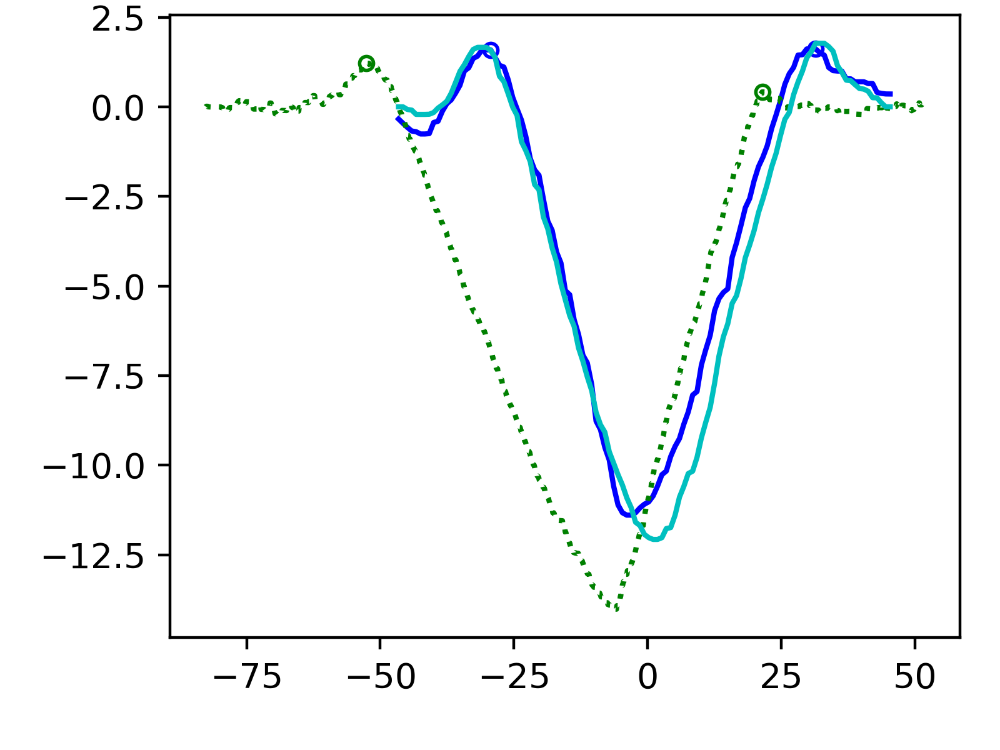

MEASUREMENTS
a b major/minor axes 74.1 60.8 mm axis ratio 0.82
major axis center -15.6 mm


In [58]:
fig,ax = plt.subplots(1,1,figsize=(4,3),dpi=200,facecolor='white')
plt.subplots_adjust(bottom=0.15,top=0.98,left=0.17,right=0.96)
#from scipy import signal
zmm_filt2 = signal.medfilt2d(zmm_filt, kernel_size=[5,5])

ii = np.argmin(np.abs(xmm))  # x=0 vertical slice 
yl_mi,zl_mi,yr_mi,zr_mi=twopeaks(ymm,zmm_filt2[:,ii])
ax.plot([yl_mi,yr_mi],[zl_mi,zr_mi],'bo',ms=4,markerfacecolor='none')
ax.plot(ymm,zmm_filt2[:,ii],'b-')

jj = np.argmin(np.abs(ymm))  # y=0 horizontal slice 
xl_ma,zl_ma,xr_ma,zr_ma=twopeaks(xmm,zmm_filt2[jj,:])
ax.plot([xl_ma,xr_ma],[zl_ma,zr_ma],'go',ms=4,markerfacecolor='none')
ax.plot(xmm,zmm_filt2[jj,:],'g:')

kk = np.argmin(np.abs(xmm+15))  # another vertical slice
ax.plot(ymm,zmm_filt2[:,kk],'c-')

a_maj=xr_ma - xl_ma  #major and minor axes rim positions subtracted 
b_min= np.abs(yr_mi - yl_mi)
a_cen =(xl_ma + xr_ma)/2  #major rim positions averaged 

axis_ratio = b_min/a_maj
print('MEASUREMENTS')
print('a b major/minor axes {:.1f} {:.1f} mm axis ratio {:.2f}'.format(a_maj,b_min,axis_ratio))
print('major axis center {:.1f} mm'.format(a_cen))

#### process still 

In [86]:
# read in a still photograph from above
mfile='laser_scan_data/June_1_2023/A040_still_S001.png'
still = pims.open(mfile) 
still_im = still[0]
print(still[0].shape)

(2160, 3840, 3)


In [87]:
plt.imshow(still_im)
x1,x2=1512,1712  # get pixel scale , adjust these to fit metal cube
y1,y2=1559,1563
plt.plot([x1,x2],[y1,y2],'c-',lw=2)
pixscale_still = 25.4/(x2-x1) # mm per pix
still_im_rot = ndimage.rotate(still_im,4,reshape=False)  #rotate the image 
print('px scale {:.3f} mm per pix'.format(pixscale_still))

px scale 0.127 mm per pix


In [88]:
plt.imshow(still_im_rot)
x_deep_still,y_center_still = 1751,990  # guess at impact point, this is deepest point
x_center_still = x_deep_still + 5/pixscale_still    # how many pixels to correct for impact point
plt.plot([x_center_still],[y_center_still],'k+',ms=10)

xl = int(x_center_still + x_winl/pixscale_still)
xr = int(x_center_still + x_winr/pixscale_still)
yb = int(y_center_still + y_winl/pixscale_still)
yt = int(y_center_still + y_winr/pixscale_still)

extent_still = [x_winl,x_winr,y_winl,y_winr]
still_im_short = still_im_rot[yb:yt,xl:xr]

<IPython.core.display.Javascript object>


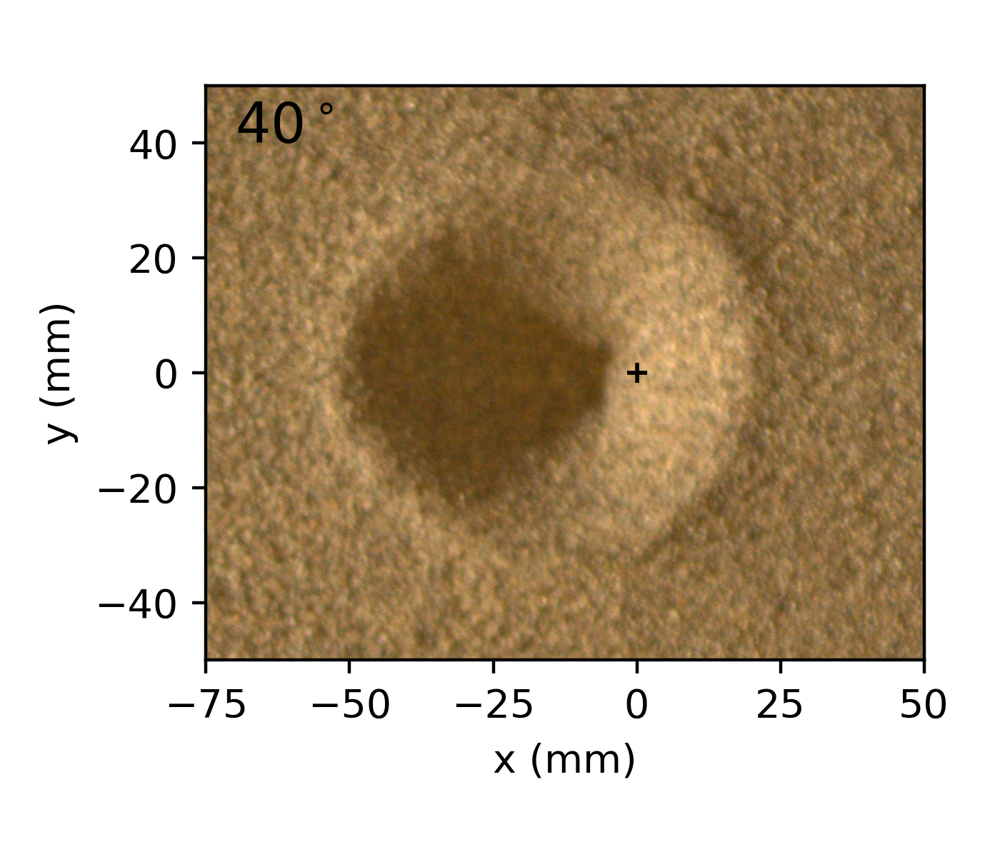

In [92]:
# make a nice figure of still
fig,ax = plt.subplots(1,1,figsize=(3.5,3),dpi=200,facecolor='white')
plt.subplots_adjust(bottom=0.23,top=0.90,left=0.17,right=0.96)
ax.set_aspect(1)
ax.imshow(still_im_short,extent=extent_still)
ax.set_xlabel('x (mm)')
ax.set_ylabel('y (mm)')
ax.plot([0],[0],'k+',ms=5)
ax.text(-70,40,froot[1:3]+r'$^\circ$',color='black',fontsize=14)
plt.savefig(froot+'still.png',dpi=200)

In [103]:
ofile = froot + 'profile'
np.savez(ofile, xmm=xmm, ymm=ymm,zmm_filt=zmm_filt,slope_deg=slope_deg,still_im_short = still_im_short)

In [46]:
#Look at scale bar for hsv
# extract 2 scale images from hsv with scale cube
#/usr/local/bin/ffmpeg -i a040ascale.mp4  -ss 00:00:0.000 -vframes 2   hs_scale%04d.png -hide_banner
mfile='laser_scan_data/June_1_2023/pngs/hs_scale000*.png'
hs_scale_frames = pims.open(mfile) 
hs_fps = 1000.0  # fps

<IPython.core.display.Javascript object>


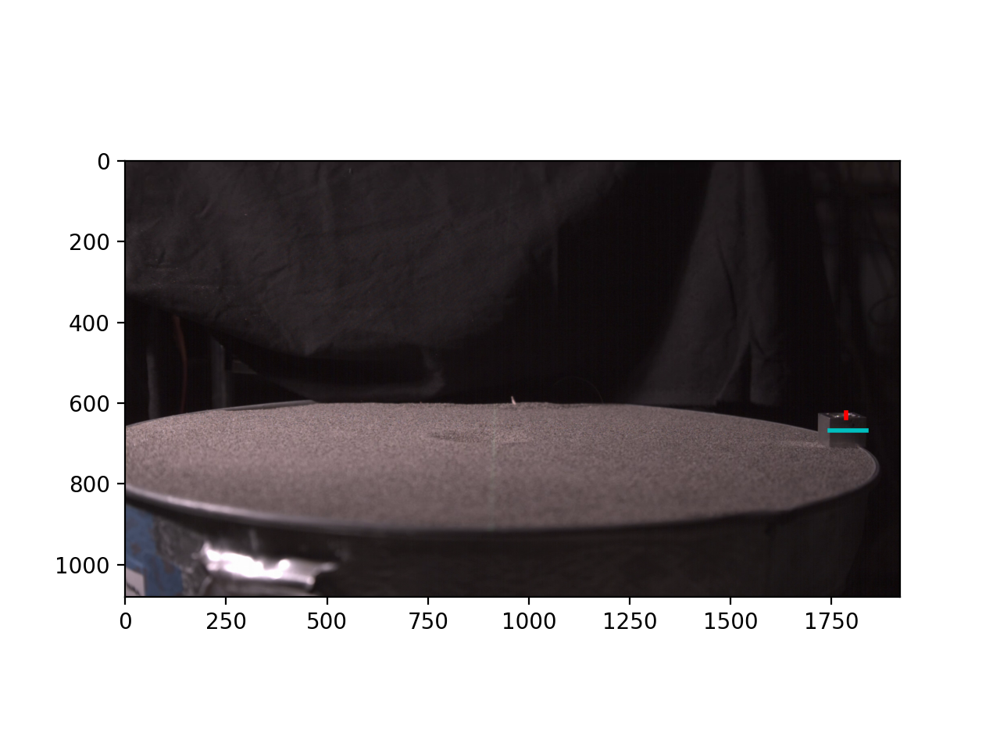

pix scale hsv 0.279 mm per pix
hsv cam angle 8.2 deg


In [47]:
# get pixelscale for hsv
plt.imshow(hs_scale_frames[1])
x1,x2=1745,1836
y1,y2=668,668
plt.plot([x1,x2],[y1,y2],'c-',lw=2)
pixscale_hsv = 25.4/(x2-x1) # mm per pix
x3,y3=1785,636
x4,y4=1785,623
plt.plot([x3,x4],[y3,y4],'r-',lw=2)
cam_angle = np.arcsin(np.abs((y3-y4)/(x2-x1)))
print('pix scale hsv {:.3f} mm per pix'.format(pixscale_hsv))
print('hsv cam angle {:.1f} deg'.format(cam_angle*180.0/np.pi))

In [48]:
# now look at hsv 1000 fps
#/usr/local/bin/ffmpeg -i a040a.mp4  -ss 00:00:16.000 -vframes 40   hs%04d.png -hide_banner
mfile='laser_scan_data/June_1_2023/pngs/hs*.png'
hs_frames = pims.open(mfile) 


<IPython.core.display.Javascript object>


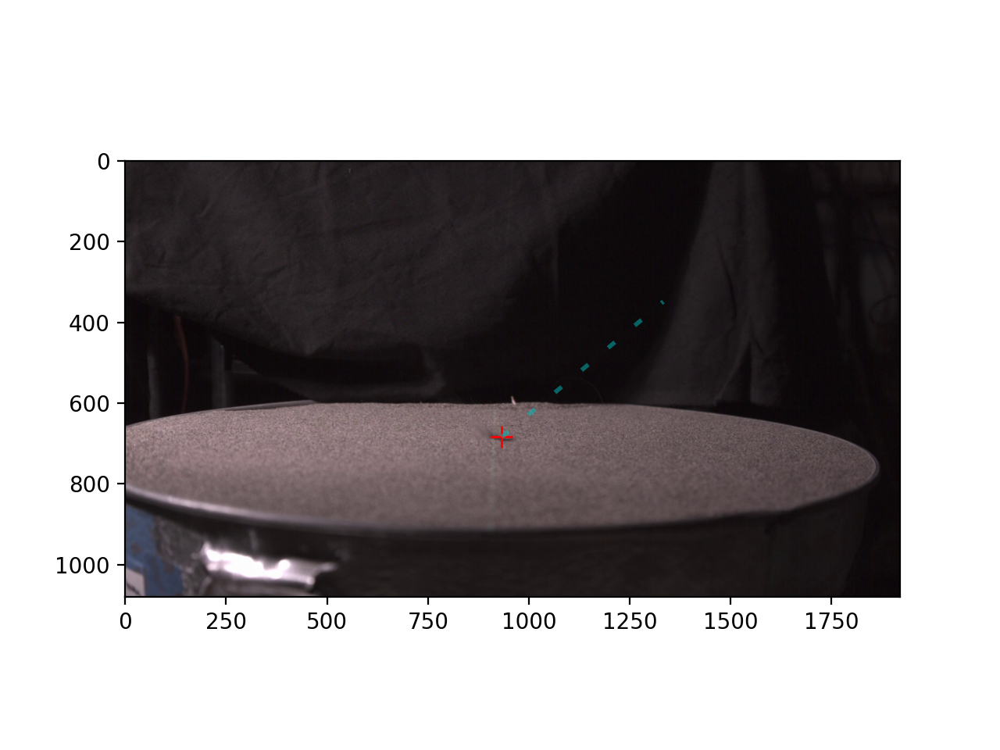

In [50]:
plt.imshow(hs_frames[4])
# guess at impact point, which I will then adjust
x_impact_hsv,y_impact_hsv = 933,684  # adjusted ! in pixels
I_angle = 40*np.pi/180.    # adjusted! this is the impact angle and it agrees with what we expected !!!!
plt.plot([x_impact_hsv],[y_impact_hsv],'r+',ms=10)
xlin = np.linspace(0,1,100)*400
#ylin = -xlin*np.sin(I_angle)*np.cos(cam_angle) + y_impact_hsv  
ylin = -xlin*np.tan(I_angle) + y_impact_hsv  
plt.plot(xlin + x_impact_hsv,ylin,'c',lw=2,dashes=[2, 6],alpha=0.5)

<IPython.core.display.Javascript object>


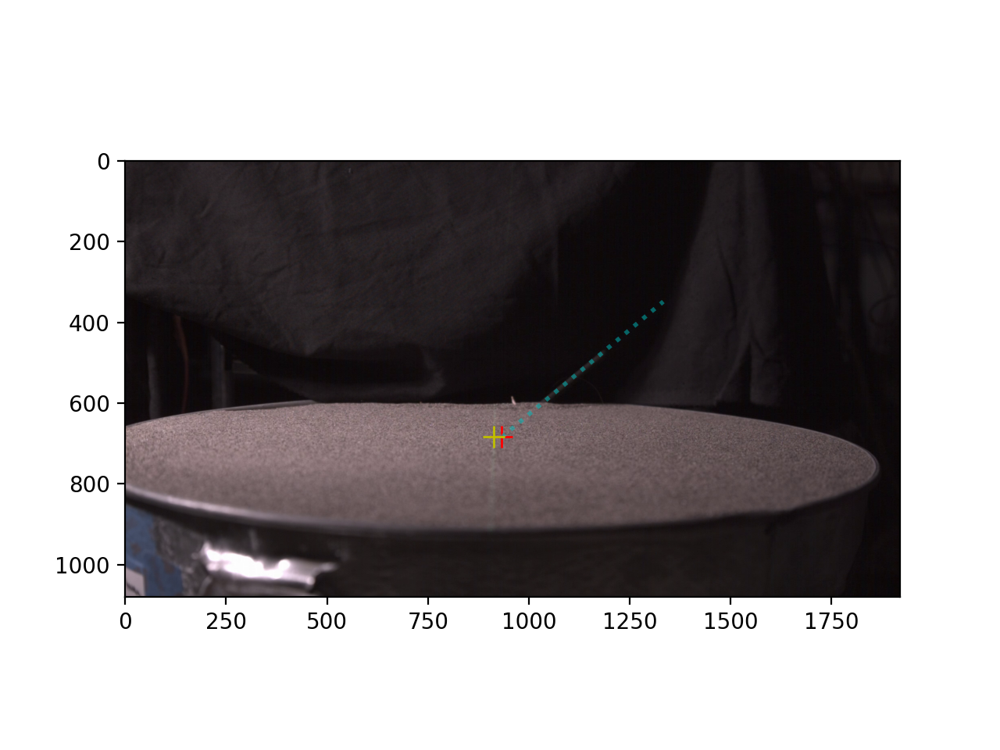

CORRECTION
impact point is 5.3 mm to right of green line
impact point correction to blmagic images 73.0 pix


In [51]:
# check impact point and angle
#I_angle = 40*np.pi/180.    # adjusted! matches what we thought it was!!!! 
fig,ax = plt.subplots(1,1)
ax.imshow(hs_frames[3])
ax.set_aspect(1)
#x_impact_hsv,y_impact_hsv = 933,684
plt.plot([x_impact_hsv],[y_impact_hsv],'r+',ms=10)
xlin = np.linspace(0,1,100)*400
#ylin = -xlin*np.sin(I_angle)*np.cos(cam_angle) + y_impact_hsv  
ylin = -xlin*np.tan(I_angle) + y_impact_hsv  
ax.plot(xlin + x_impact_hsv,ylin,'c:',lw=2,alpha=0.5)
x_green_line=914
plt.plot([x_green_line],[y_impact_hsv],'y+',ms=10)
dx_green = (x_impact_hsv - x_green_line ) * pixscale_hsv
print('CORRECTION')
print('impact point is {:.1f} mm to right of green line'.format(dx_green))
print('impact point correction to blmagic images {:.1f} pix'.format(dx_green/pixscale_mm_per_pix))

Frame([[ 37.3433,  41.3433,  41.3433, ...,  29.3433,  29.3433,  29.3433],
       [ 39.3433,  42.3433,  42.3433, ...,  28.3433,  27.3433,  27.3433],
       [ 39.4875,  39.4875,  42.4875, ...,  25.4875,  25.4875,  27.4875],
       ...,
       [112.7643, 113.7643, 121.4152, ...,   9.9904,   9.9904,  10.9904],
       [ 90.4815, 100.4815, 114.994 , ...,   8.9904,  10.9904,  10.9904],
       [ 90.4815,  92.4815, 104.994 , ...,   8.9904,   7.9904,   8.9904]])
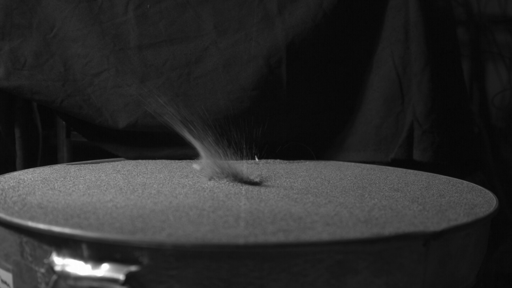

In [46]:
pims.as_gray(hs_frames[9])

<IPython.core.display.Javascript object>


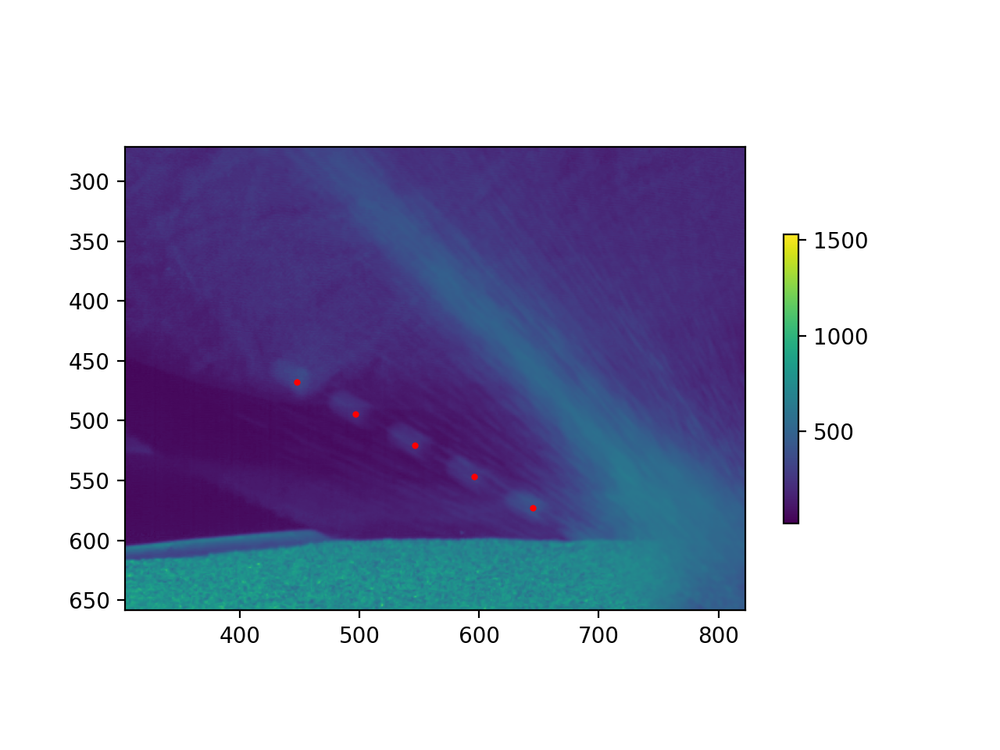

MEASUREMENTS
ricochet angle 28.0 deg
ricohet velocity 7.8 m/s


In [119]:
# left to do is do some measurements!
# add gray scale frames to show ricochet
imsum = pims.as_gray(hs_frames[11])
for j in range(13,22,2):
    imsum += pims.as_gray(hs_frames[j])
fig,ax = plt.subplots(1,1)
im = ax.imshow(imsum)
plt.colorbar(im,shrink=0.5)
xp1,yp1 = 645,573  # ricochet of BB, one point
R_angle_deg = 28.0  #adjusted ricochet angle
R_angle = R_angle_deg*np.pi/180.0  # 
v_R = 7.8 # m/s  # adjust this
dt = 1.0/hs_fps  *2  # two frames separation 
v_R_pix_s = v_R*1e3/pixscale_hsv  # speed in pix per s
d_R = v_R_pix_s *dt  # distance travelled per 2frame
#print('{:.1f} {:.1f}'.format(v_R_pix, d_R))
for i in range(5):
    x = xp1 - np.cos(R_angle)*d_R*i
    y = yp1 - np.sin(R_angle)*d_R*i
    #print(x,y)
    ax.plot(x,y,'ro',ms=2)

print('MEASUREMENTS')
print('ricochet angle {:.1f} deg'.format(R_angle_deg))
print('ricohet velocity {:.1f} m/s'.format(v_R))

In [104]:
ff_impact = 3.5  # estimate for time of impact, this is image where we see just before impact + a little bit

<IPython.core.display.Javascript object>


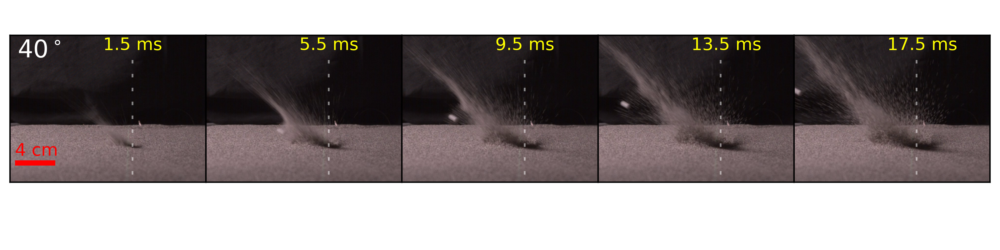

433 234


In [95]:
# make a figure showing ejecta curtain stills 
# frame 3 was before impact and frame 4 was just after impact
flist_ej = np.arange(5,5+20,4)
nw = len(flist_ej)
fig,axarr = plt.subplots(1,nw,figsize=(8,2),dpi=200,facecolor='white',sharex=True,sharey=True)
plt.subplots_adjust(bottom=0.15,top=0.98,left=0.01,right=0.99,hspace=0,wspace=0)
#ax.set_aspect(1.0)
wx,wy = 400,300
xlow,xhigh = x_impact_hsv - wx - int(wx/4), x_impact_hsv + wx - int(wx/4)
ylow,yhigh = y_impact_hsv - wy - int(wy/2), y_impact_hsv + wy - int(wy/2)


print(xlow,ylow)
for i in range(len(flist_ej)):
    axarr[i].imshow(hs_frames[flist_ej[i]][ylow:yhigh,xlow:xhigh])
    xbar = wx + int(wx/4)
    axarr[i].plot([xbar,xbar],[100,2*wy-1],'w',dashes=[2,6],alpha=0.5,lw=1)
for i in range(len(flist_ej)):
    axarr[i].xaxis.set_ticklabels([])
    axarr[i].yaxis.set_ticklabels([])
    axarr[i].set_xticks([])
    axarr[i].set_yticks([])
for i in range(len(flist_ej)):
    t= (flist_ej[i]-ff_impact) * 1000/hs_fps
    t_text = '{:.1f} ms'.format(t)
    axarr[i].text(380,60,t_text,fontsize=10,color='yellow')
# now put a scale bar
axarr[0].plot([0 + 30,40/pixscale_hsv + 30],[520,520],'r-',lw=3)
axarr[0].text(20,490,'4 cm',color='red',fontsize=10)
axarr[0].text(30,90,froot[1:3]+r'$^\circ$',color='white',fontsize=14)

plt.savefig(froot+'ejecta.png',dpi=200)

In [113]:
from skimage.feature import hog
from skimage import data, exposure

# compute histogram of oriented gradients (hog) of grey image 
# return feature vector of hog and hog_image for display
# di and dj are cell sizes called to make hog
# norientations = number of orientations for histograms
# extent is for real sizes in display
# if showit=1 make imshow it 
# see https://www.learnopencv.com/histogram-of-oriented-gradients/
def compute_hog(image,extent,di,dj,norientations,showit):
    fdo, hog_image = hog(image, orientations=norientations, pixels_per_cell=(di, dj),
                    cells_per_block=(1, 1), visualize=True, multichannel = False, channel_axis=False\
                    ,feature_vector = False)
    print(fdo.shape)  # format of feature vector thing
    # Rescale histogram for better display
    hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 1))
    if (showit==1):
        fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(5, 5), sharex=True, sharey=True)
        plt.subplots_adjust(hspace=0,wspace=0)
        ax1.imshow(image, cmap=plt.cm.gray,extent=extent)
        ax1.set_title('Input image')
        ax2.imshow(hog_image_rescaled.transpose(), cmap=plt.cm.gray,extent=extent)
        ax2.set_title('Histogram of Oriented Gradients')
        #plt.show()
    return fdo,hog_image_rescaled


# compute arrows for each cell of hog
# fdo is output of hog, feature vector histograms
# di and dj are cell sizes called to make hog
# xvec and yvec are positions of pixels in real space
# return x,y positions and orientations of arrows
# arrows are computed from the mean of the hog histograms
# also returns an image with angle values in it
def mkarrows(fdo,hog_image_rescaled,di,dj,xvec,yvec,image,image_mask,showit):
    
    lhist = fdo.shape[4]  # length of histogram
    xarr = np.array([])
    yarr = np.array([])
    garr = np.array([])
    ang_arr = np.array([])
    ni = fdo.shape[0] #fdo[10,20,0,0,:]
    nj = fdo.shape[1]
    dphi = np.pi/lhist  # angular bin width in radians
    phiarr = np.arange(0,lhist)*dphi +dphi/2 
        # angles for each bin, centered, not sure about extra dphi/2
    # phi only goes from 0, to pi
    hx = np.cos(phiarr*2)  # 2 is because of pi redundancy
    hy = np.sin(phiarr*2)
    ang_img = np.zeros((nj,ni))
    for i in range(ni):
        x0=xvec[i*di + int(di/2)]  
        for j in range(nj):
            y0=-yvec[j*di + int(dj/2)]  # flip y?
            xarr = np.append(xarr,x0)
            yarr = np.append(yarr,y0)
            hist = np.squeeze(fdo[i,j,0,0,:])
            sum_hx = np.sum(hist*hx)  # compute xbar from histogram (means)
            sum_hy = np.sum(hist*hy)  # compute ybar
            ang = np.arctan2(sum_hy,sum_hx)/2 
            ang_arr = np.append(ang_arr,ang)  # list of angles
            ang_img[j,i] = ang #  an image where value in each position is angle
            glevel = image_mask[j,i]  #store brightness at the spot in the mask
            garr = np.append(garr,glevel)
    #ang_arr_off = np.pi/2 - ang_arr # mid bin , flip y with minus sign in angle?
    #ang_img     = np.pi/2 - ang_img
    ang_img_corr = ang_img*180/np.pi
    ii = (ang_img_corr > 90)
    ang_img_corr[ii] -= 180  # should now go from -90 to 90
    uarr = np.cos(ang_arr) # in [-1,1]
    varr = np.sin(ang_arr)  
    if (showit==1):
        fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(5, 5), sharex=True, sharey=True)
        plt.subplots_adjust(hspace=0,wspace=0)
        extent = [np.min(xvec),np.max(xvec),np.min(yvec),np.max(yvec)]
        ax1.imshow(image, cmap=plt.cm.gray,extent=extent)
        #ax1.set_title('Input image')
        ax1.quiver(xarr,yarr,uarr,varr,color='blue',pivot='mid',width=0.002,\
                  headwidth=0,headlength=0,headaxislength=0)
        ax2.imshow(hog_image_rescaled, cmap=plt.cm.gray,\
           extent=extent,vmin=0,vmax=1)
        ax2.quiver(xarr,yarr,uarr,varr,color='red',pivot='mid',width=0.002, \
                  headwidth=0,headlength=0,headaxislength=0)
        #ax2.set_title('Arrows')
    return xarr,yarr,uarr,varr,ang_arr,ang_img,ang_img_corr,garr




/var/folders/sw/k4l2qx0s4bb9yn3d07x4n_8r0000gn/T/ipykernel_86458/3248017961.py:12: FutureWarning: `multichannel` is a deprecated argument name for `hog`. It will be removed in version 1.0. Please use `channel_axis` instead.
  fdo, hog_image = hog(image, orientations=norientations, pixels_per_cell=(di, dj),


(55, 44, 1, 1, 11)


<IPython.core.display.Javascript object>


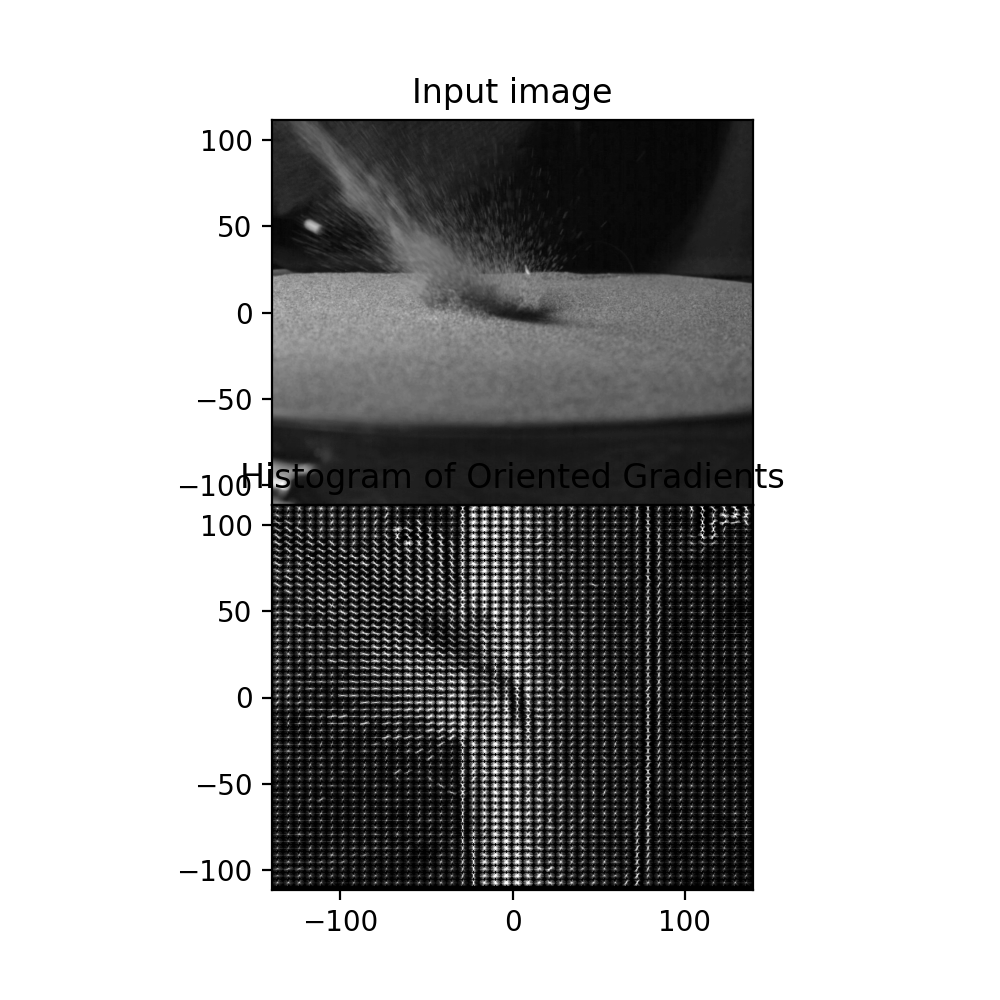

In [114]:
ff_quiver = int(ff_impact) + 15
wx_hog,wy_hog = 500,400
xlow_hog,xhigh_hog = x_impact_hsv - wx_hog , x_impact_hsv + wx_hog   # in pixels 
ylow_hog,yhigh_hog = y_impact_hsv - wy_hog , y_impact_hsv + wy_hog 
xvec_hog = np.arange(-wx_hog,wx_hog,1)  *pixscale_hsv
yvec_hog = np.arange(-wy_hog,wy_hog,1)  *pixscale_hsv

image0 = np.squeeze(hs_frames[0][ylow_hog:yhigh_hog ,xlow_hog:xhigh_hog,0])  # take red image
image =  np.squeeze(hs_frames[ff_quiver][ylow_hog:yhigh_hog ,xlow_hog:xhigh_hog,0])  # take red image
showit = 1; 
extent_hsv = np.array([-wx_hog, wx_hog, -wy_hog, wy_hog])*pixscale_hsv
di=18;dj=di  # cell sizes in pixels, pixels per cell for hog
norientations = 11
fdo,hog_image_rescaled=compute_hog(image,extent_hsv,di,dj,norientations,showit)  #compute hog
#compute arrows 
xarr,yarr,uarr,varr,ang_arr,ang_img,ang_img_corr,garr = \
    mkarrows(fdo,hog_image_rescaled,di,dj,xvec_hog,yvec_hog,image,image-image0,0)

<IPython.core.display.Javascript object>


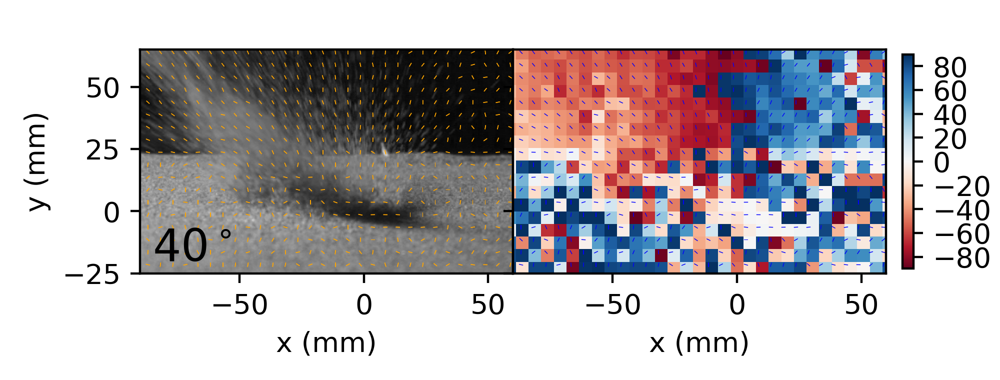

In [115]:
fig, (ax1,ax2) = plt.subplots(1, 2, figsize=(5, 1.9),sharex=True,sharey=True,facecolor='white',dpi=200)  
plt.subplots_adjust(bottom=0.16,top=0.99,left=0.14,right=0.96,hspace=0,wspace=0)
ax1.imshow(image, cmap=plt.cm.gray,extent=extent_hsv)
ax1.quiver(xarr,yarr,uarr,varr,color='orange',pivot='mid',width=0.002,\
              headwidth=0,headlength=0,headaxislength=0)
ax1.set_ylim([-25,65])
ax1.set_xlim([-90,60])
ax1.set_xlabel('x (mm)'); ax2.set_xlabel('x (mm)')
ax1.set_ylabel('y (mm)')

ax1.quiver(xarr,yarr,uarr,varr,color='orange',pivot='mid',width=0.002,\
              headwidth=0,headlength=0,headaxislength=0)

im=ax2.imshow(ang_img_corr,extent=extent_hsv,cmap='RdBu',vmin=-90, vmax=90)
ax2.quiver(xarr,yarr,uarr,varr,color='blue',pivot='mid',width=0.002,\
              headwidth=0,headlength=0,headaxislength=0)
plt.colorbar(im,ax=(ax1,ax2),fraction=0.07, pad=0.02,shrink=0.68,anchor=(0.00, 0.5),\
                ticks=[-80,-60,-40,-20,0,20,40,60,80])

ax1.text(-85,-20,froot[1:3]+r'$^\circ$',color='black',fontsize=16)
plt.savefig(froot+'quiver.png',dpi=200)

In [117]:
ofile = froot + 'quiver'
np.savez(ofile, xarr=xarr, yarr=yarr,uarr = uarr, varr= varr, image = image, ang_img_corr = ang_img_corr, \
        extent_hsv=extent_hsv)
